# **Notebook for peaks indexation of Theo fev2026 Soleil Data**
#### This notebook is in 2 parts: 1- example on how to use the pipeline for peaks indexation, 2- different examples on:
- cubes of 30 nm
- cubes of 11 nm
- sphere of 12 nm

**Important**:

 - For peak detection: you can either use the **CorrelationDistanceCalculator** function to detect peaks in the I(q) curve, which is the simple method based on the second derivative. Or you can use the more advanced method **detect_peaks_hybrid_interactive()**. If you use the second method, put at least two cells (one for the interactive detection of peaks, and one for the rest of the computation). This is shown in the examples in the first part. Also now this fonction uses the azimuthal angle = -90 and the width = 360 by default, it used to be parameters in the function but it was changed in the new version of Nicolas.

 - New feature:  **get_all_params(excel_file, bg_path, fileh5)** that extracts automatically the diameter and its polydispersity. It also extracts the file reference background.


In [1]:
%matplotlib widget
from saxsprocessor import SAXSProcessor
import os
import glob
import numpy as np
from correlationdistancecalculator import CorrelationDistanceCalculator
from matplotlib import pyplot as plt

from saxsprocessor import SAXSProcessor
from correlationdistancecalculator import CorrelationDistanceCalculator
from utilities_SWING import *
from utilities import *

from excel_parameters_extractor import get_all_params

  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\ipykernel_launcher.py", line 18, in <module>
    app.launch_new_instance()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\traitlets\config\application.py", line 1075, in launch_instance
    app.start()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\ipykernel\kernelapp.py", line 739, in start
    self.io_loop.start()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\tornado\platform\asyncio.py", line 211, in start
    self.asyncio_loop.run_forever()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\asyncio\base_events.py", line 608, in run_forever
    self._run_once()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\asyncio\base_events.py", line 1936, in _run_once
    handle._run()
  File "c:\Users\saram\anaconda3\envs\debye3d_env\Lib\asyncio\events

## 1. Example of the workflow using CorrelationDistanceCalculator() to find the peaks
Example of a cube of 30 nm (measurement M0213)

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0213 for index of h5 file 273.0
Extracted parameters from excel:
Length of the cube: 29 nm
Polydispersity on length: 15.517241379310345 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm\lacroix_00148_2026-02-06_06-55-44.nxs
position moteur :
{'X_start': array([36.9]), 'X_end': array([37.1495]), 'Z_start': array([40.6997]), 'Z_end': array([40.9501])}
{'X_start': array([36.9]), 'X_end': array([37.1495]), 'Z_start': array([40.6997]), 'Z_end': array([40.9501])}
step :
[0.04158333]
[0.04173333]
1
Raw data shape: (6, 6, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
step :
[0.183325]
[0.1750375]
1
Raw data shape: (12, 8, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel size: 7.

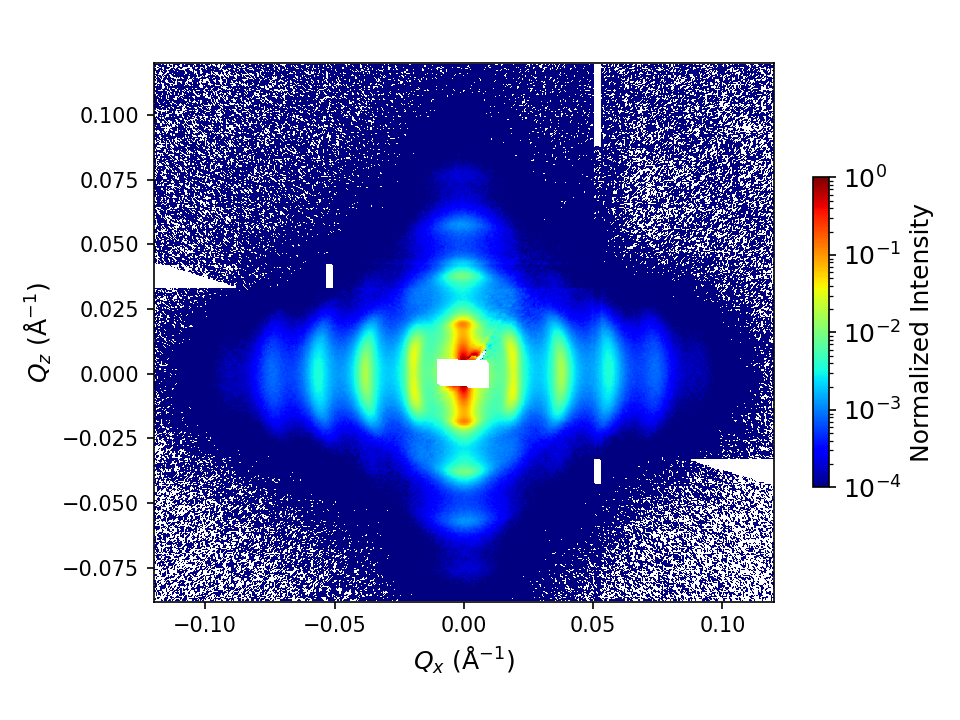

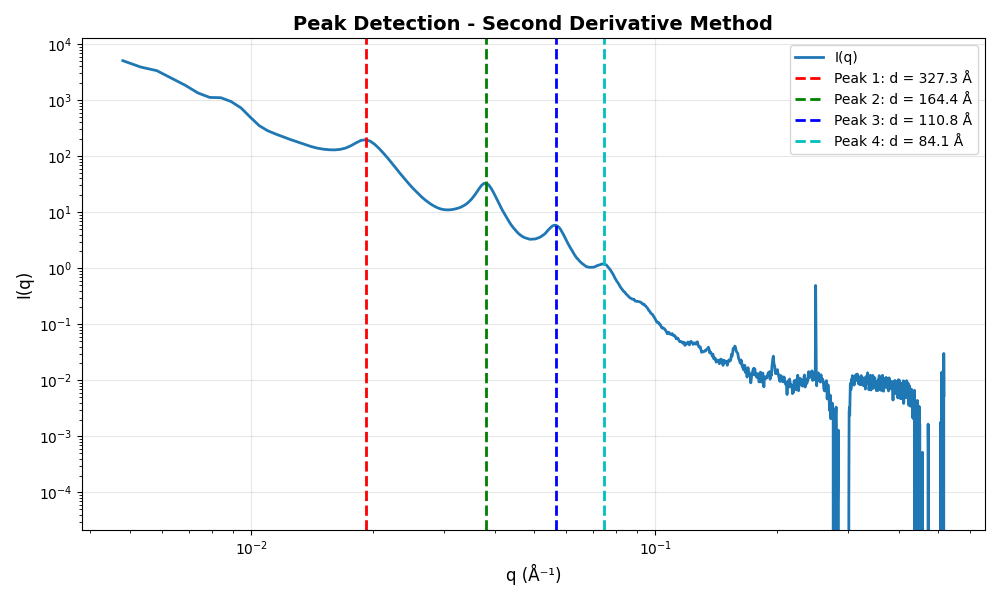

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/saxs_images/S0037_M0213_Img_273_with_q-circles.png


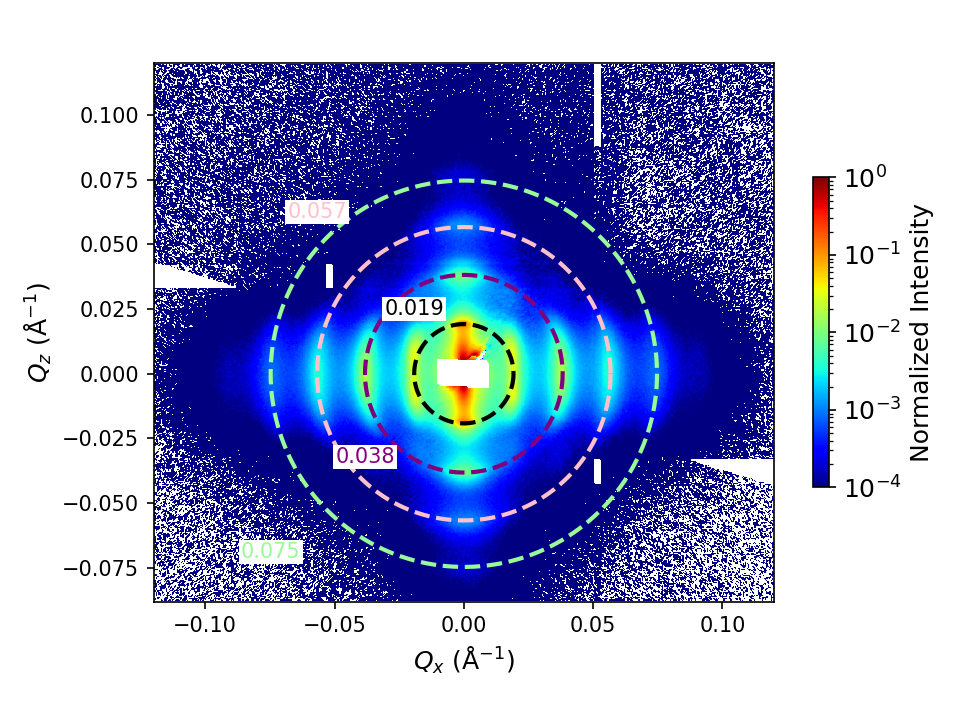

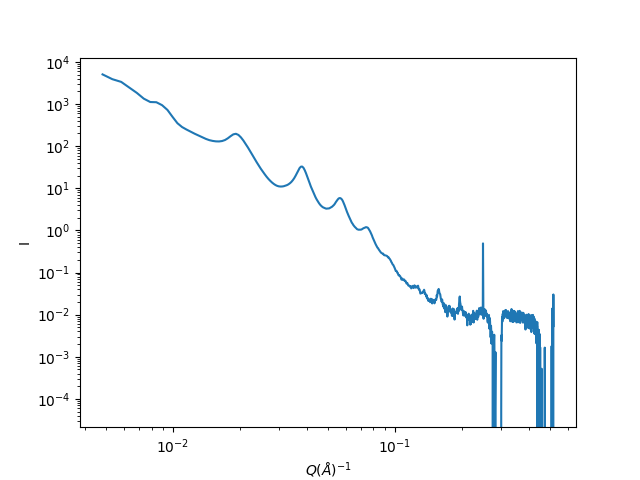

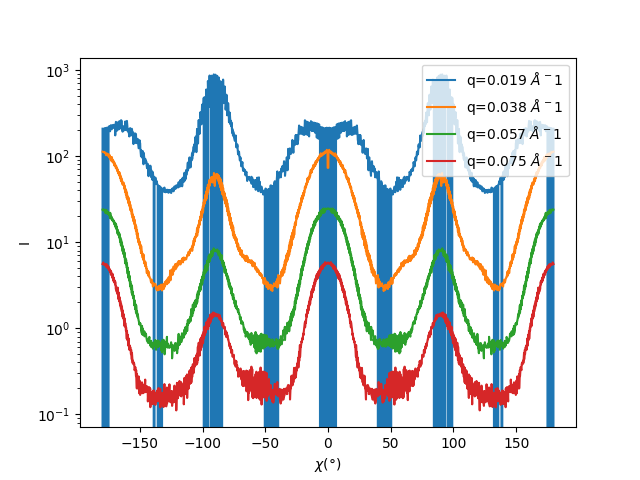

In [15]:

# 1. Define the paths to your files and folders. The excel file should contain the parameters of your measurements, including the reference file for background subtraction. 
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/lacroix_00273_2026-02-07_04-25-29.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

# 2. Function to extract parameters from the excel file automatically, like the reference file for background subtraction
length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# 3. Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

# 4.Extract the radial profile (I vs q) from the 2D SAXS pattern
q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')

# 5.Two ways to detect the peaks: here it's the simple method based on the 2nd derivate method
# Use the CorrelationDistanceCalculator to detect peaks in the I(q) curve, which correspond to characteristic distances in the sample
corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=4,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)

# 6. For each detected peak, extract the azimuthal profile (I vs chi) at that q value to analyze the anisotropy of the scattering
plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

# 7. Finally, plot the 2D SAXS pattern again and mark the detected peaks with circles
proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

## 1. Example of the workflow using detect_peaks_derivative()
On the same data (cube of 30nm, measurement M0213)

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0213 for index of h5 file 273.0
Extracted parameters from excel:
Length of the cube: 29 nm
Polydispersity on length: 15.517241379310345 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm\lacroix_00148_2026-02-06_06-55-44.nxs
position moteur :
{'X_start': array([36.9]), 'X_end': array([37.1495]), 'Z_start': array([40.6997]), 'Z_end': array([40.9501])}
{'X_start': array([36.9]), 'X_end': array([37.1495]), 'Z_start': array([40.6997]), 'Z_end': array([40.9501])}
step :
[0.04158333]
[0.04173333]
1
Raw data shape: (6, 6, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
step :
[0.183325]
[0.1750375]
1
Raw data shape: (12, 8, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel size: 7.

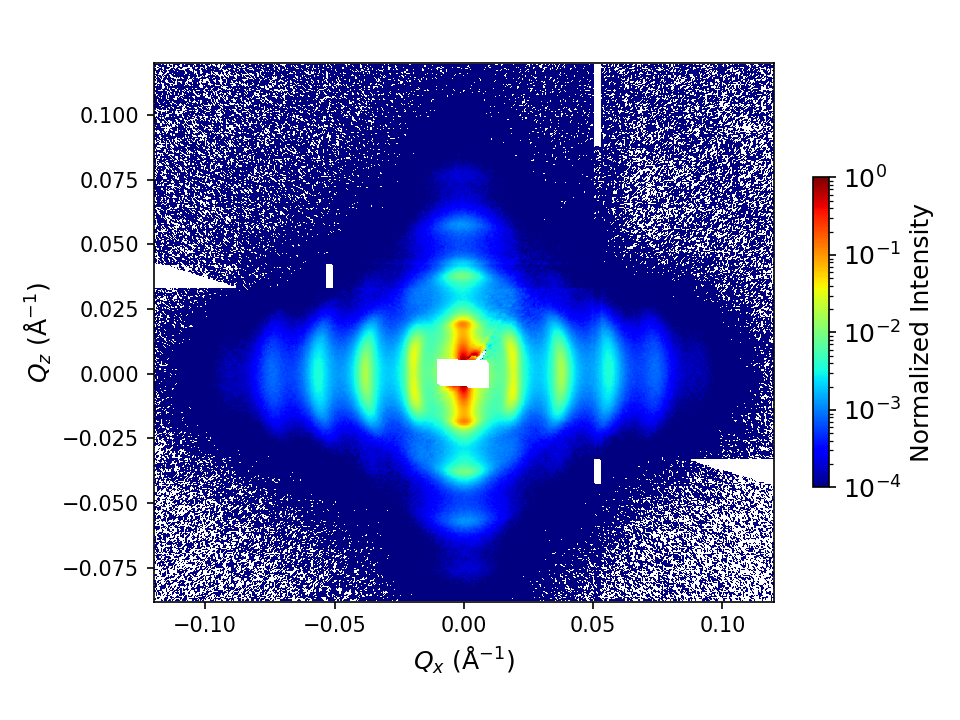

Output()

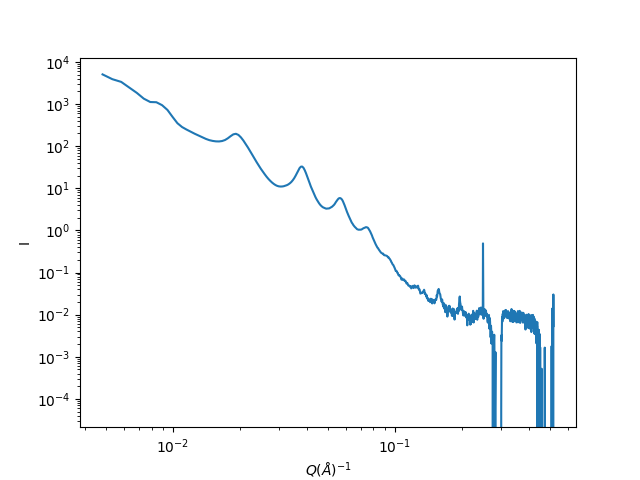

In [13]:

# 1. Define the paths to your files and folders. The excel file should contain the parameters of your measurements, including the reference file for background subtraction. 
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/lacroix_00273_2026-02-07_04-25-29.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

# 2. Function to extract parameters from the excel file automatically, like the reference file for background subtraction
length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# 3. Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

# 4.Extract the radial profile (I vs q) from the 2D SAXS pattern
q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')

# 5. Detect the peaks: Second method is a more advanced, it's an hybrid method with interactive widgets to adjust the parameters of the peak detection in real time and visualize the results immediately. 
get_results = detect_peaks_hybrid_interactive(proc,
                                    nb_peaks_init=6,
                                    qmin_init=0.03,
                                    qmax_init=0.15,
                                    fit_window_width_init=1,
                                    prominence=0.1,
                                    distance_pts=20,
                                    power_law_order=None,
                                    subtract_power_law_init=True,
									power_law_method = 'cancel')

Detected peaks at q values (Å⁻¹): [0.03820891 0.05670677 0.07520464 0.12710144]


c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/saxs_images/S0037_M0213_Img_273_with_q-circles.png


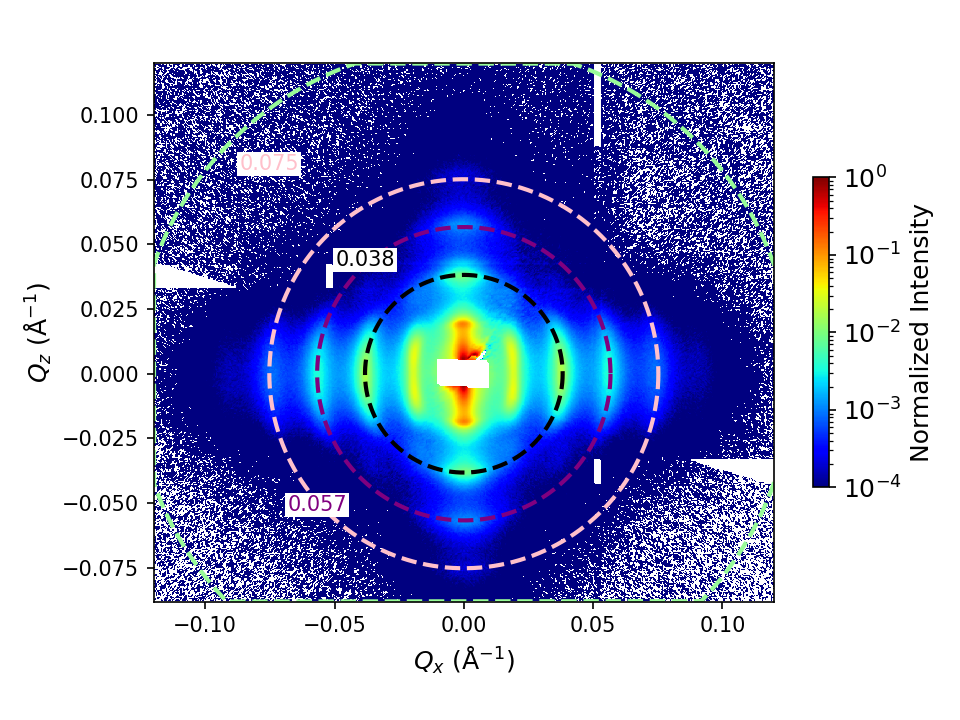

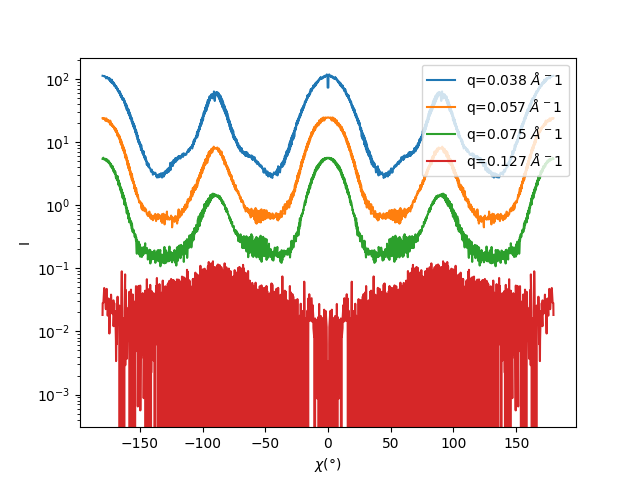

In [19]:
results_dict = get_results()
peaklist = results_dict['peaklist']

print("Detected peaks at q values (Å⁻¹):", peaklist)

# 6. For each detected peak, extract the azimuthal profile (I vs chi) at that q value to analyze the anisotropy of the scattering
plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

# 7. Finally, plot the 2D SAXS pattern again and mark the detected peaks with circles
proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

*Here it seems like the advanced method struggle more to find the first peak !*

## **2. Some results (using the first method)**
### **Cubes of 30 nm**

### Measurement M0213 was shown before

### Measurement M0214

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0214 for index of h5 file 274.0
Extracted parameters from excel:
Length of the cube: 29 nm
Polydispersity on length: 15.517241379310345 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm\lacroix_00148_2026-02-06_06-55-44.nxs
position moteur :
{'X_start': array([37.3995]), 'X_end': array([37.6493]), 'Z_start': array([41.1999]), 'Z_end': array([41.4502])}
{'X_start': array([37.3995]), 'X_end': array([37.6493]), 'Z_start': array([41.1999]), 'Z_end': array([41.4502])}
step :
[0.04163333]
[0.04171667]
1
Raw data shape: (6, 6, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
step :
[0.183325]
[0.1750375]
1
Raw data shape: (12, 8, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel si

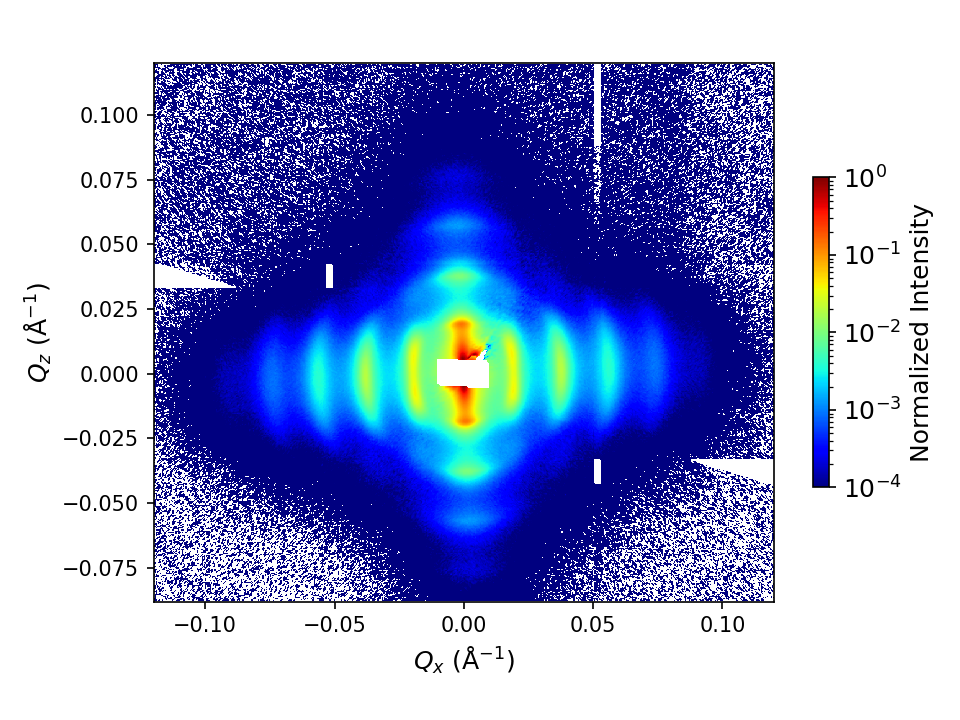

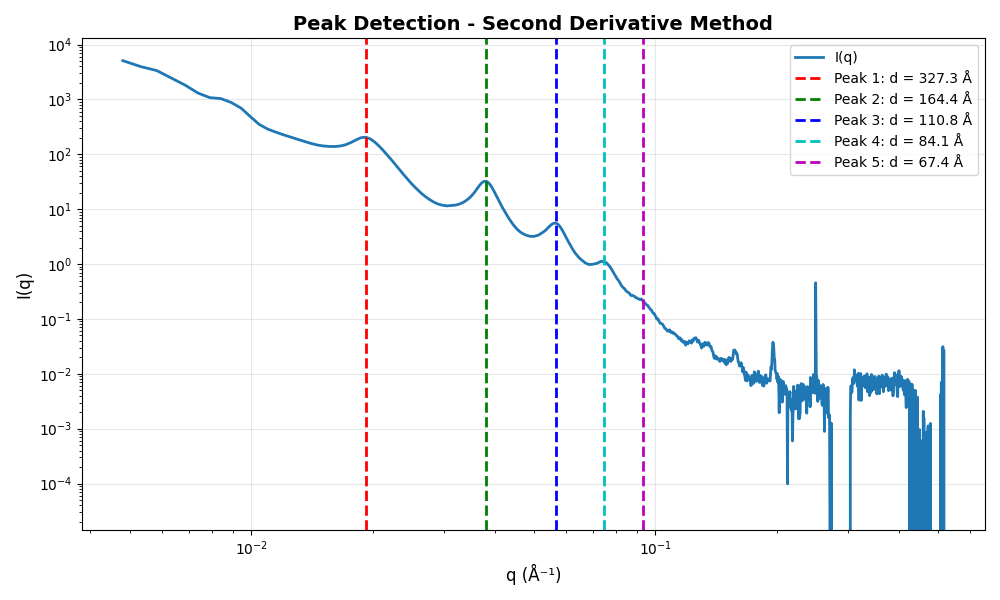

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/saxs_images/S0037_M0214_Img_274_with_q-circles.png


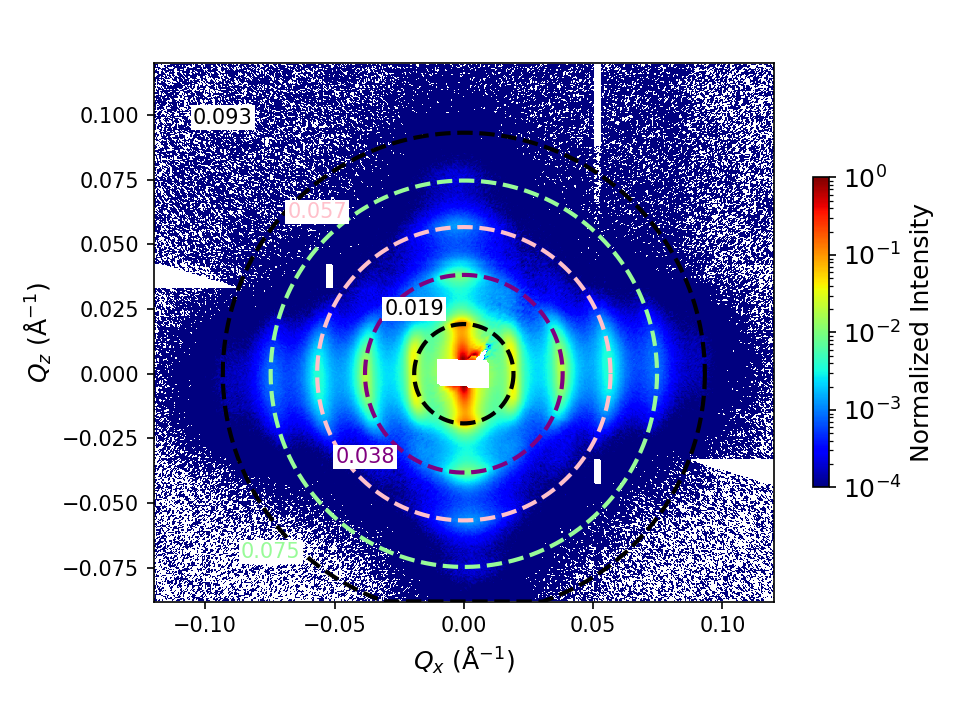

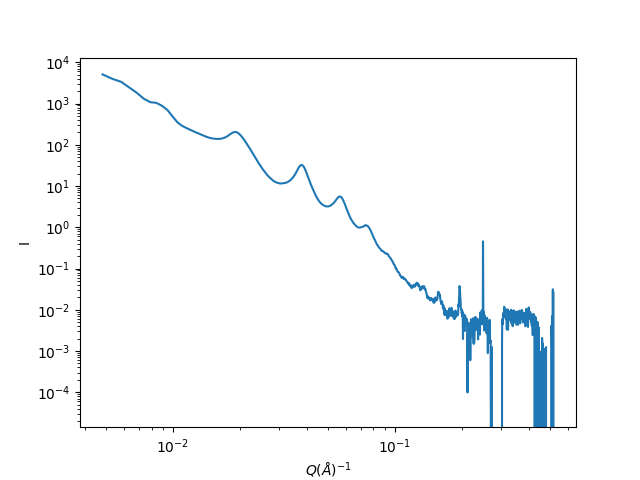

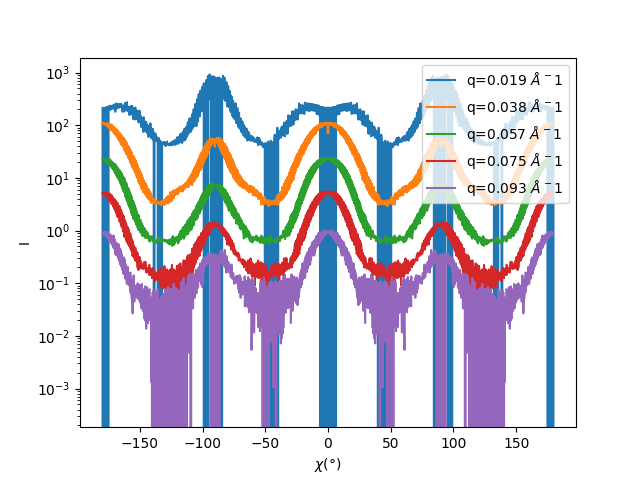

In [5]:
# 1. Define the paths to your files and folders. The excel file should contain the parameters of your measurements, including the reference file for background subtraction.
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/lacroix_00274_2026-02-07_04-27-40.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

# 2. Function to extract parameters from the excel file automatically, like the reference file for background subtraction
length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# 3. Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')

# 4. Detect the peaks: here it's the simple method based on the 2nd derivate method
corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=5,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)

# 5. For each detected peak, extract the azimuthal profile (I vs chi) at that q value to analyze the anisotropy of the scattering
plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

# 7. Finally, plot the 2D SAXS pattern again and mark the detected peaks with circles
proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

### Measurement M0215

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0215 for index of h5 file 275.0
Extracted parameters from excel:
Length of the cube: 29 nm
Polydispersity on length: 15.517241379310345 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm\lacroix_00148_2026-02-06_06-55-44.nxs
position moteur :
{'X_start': array([37.9003]), 'X_end': array([38.15]), 'Z_start': array([40.8994]), 'Z_end': array([41.15])}
{'X_start': array([37.9003]), 'X_end': array([38.15]), 'Z_start': array([40.8994]), 'Z_end': array([41.15])}
step :
[0.04161667]
[0.04176667]
1
Raw data shape: (6, 6, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
step :
[0.183325]
[0.1750375]
1
Raw data shape: (12, 8, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel size: 7.5e

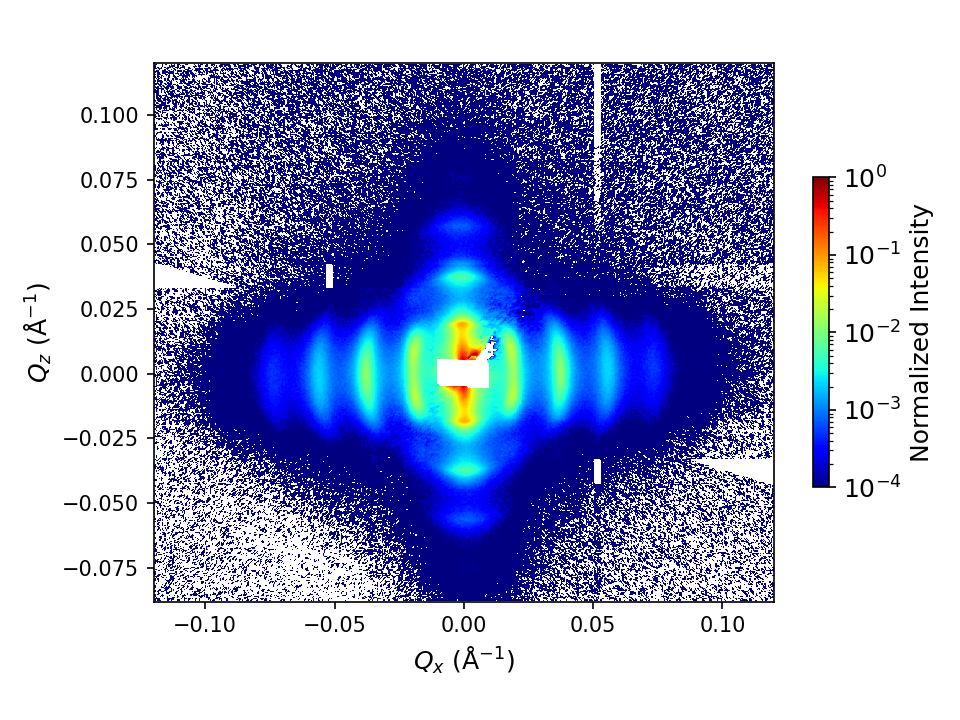

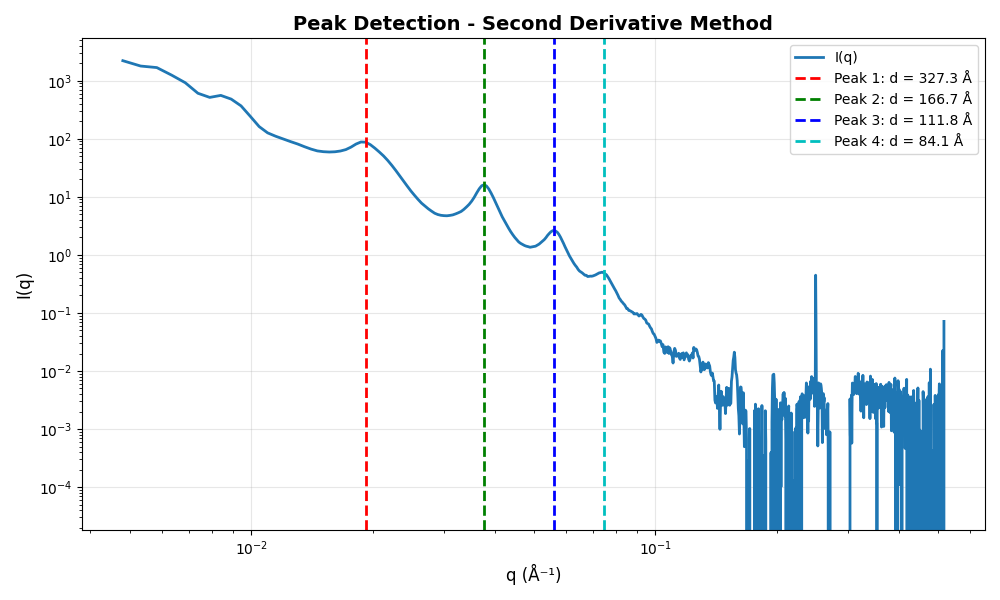

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/saxs_images/S0037_M0215_Img_275_with_q-circles.png


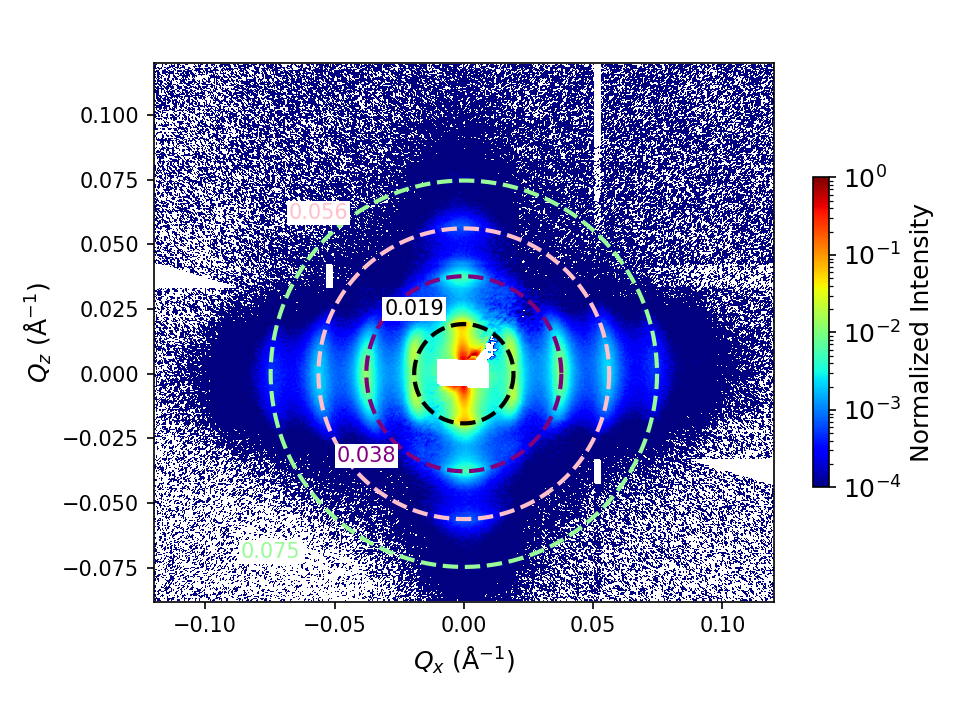

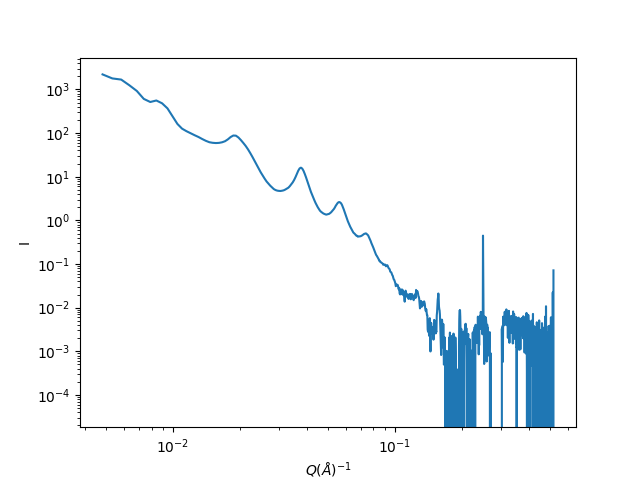

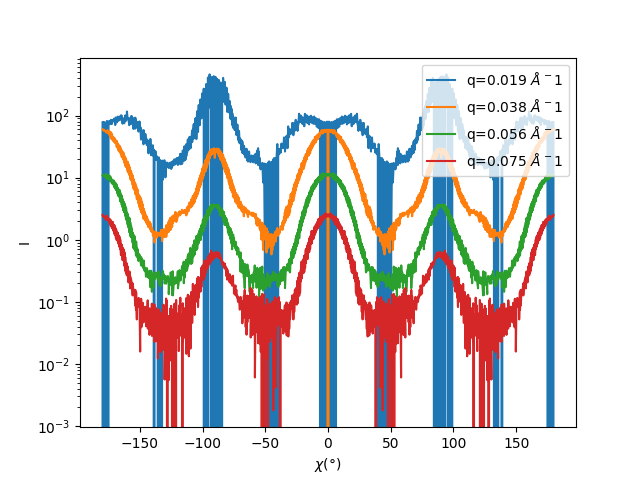

In [20]:
from excel_parameters_extractor import get_all_params
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_30mm/lacroix_00275_2026-02-07_04-29-51.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case


# Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')


corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=4,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)


plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)


### **Cubes of 11nm**

### Measurement M0136

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0136 for index of h5 file 197.0
Extracted parameters from excel:
Length of the cube: 11,1 nm
Polydispersity on length: 6.306306306306306 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm\lacroix_00196_2026-02-06_18-39-18.nxs
position moteur :
{'X_start': array([36.4995]), 'X_end': array([38.2999]), 'Z_start': array([39.2993]), 'Z_end': array([41.5002])}
{'X_start': array([36.4995]), 'X_end': array([38.2999]), 'Z_start': array([39.2993]), 'Z_end': array([41.5002])}
step :
[0.18004]
[0.18340833]
1
Raw data shape: (10, 12, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4996]), 'X_end': array([38.3998]), 'Z_start': array([39.6994]), 'Z_end': array([41.6002])}
{'X_start': array([36.4996]), 'X_end': array([38.3998]), 'Z_start': array([39.6994]), 'Z_end': array([41.6002])}
step :
[0.09501]
[0.09504]
1
Raw data shape: (20, 20, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixe

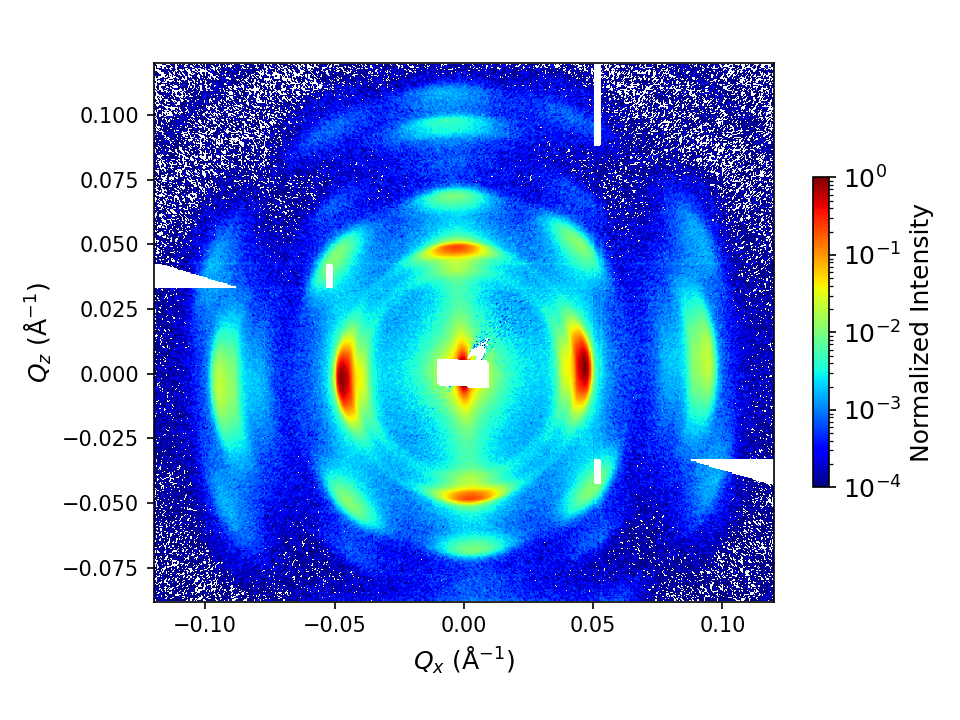

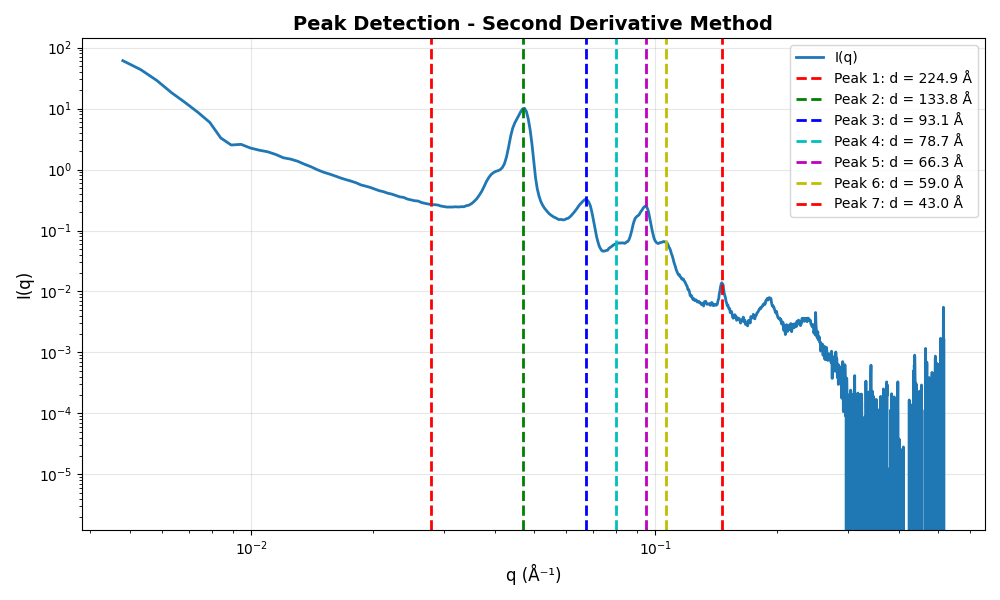

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/saxs_images/S0020_M0136_Img_197_with_q-circles.png


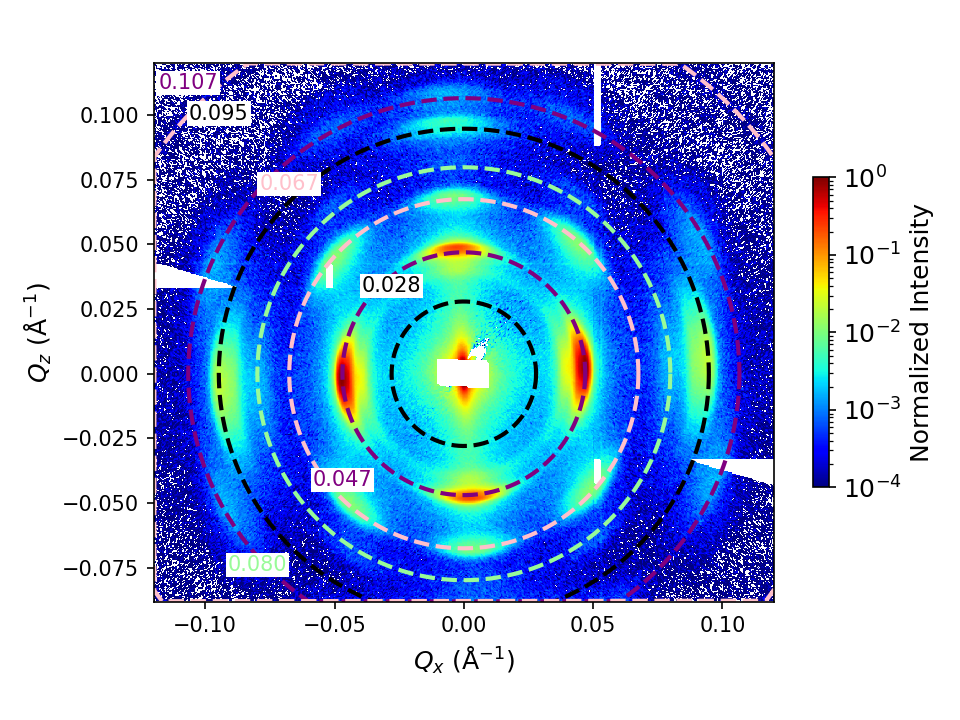

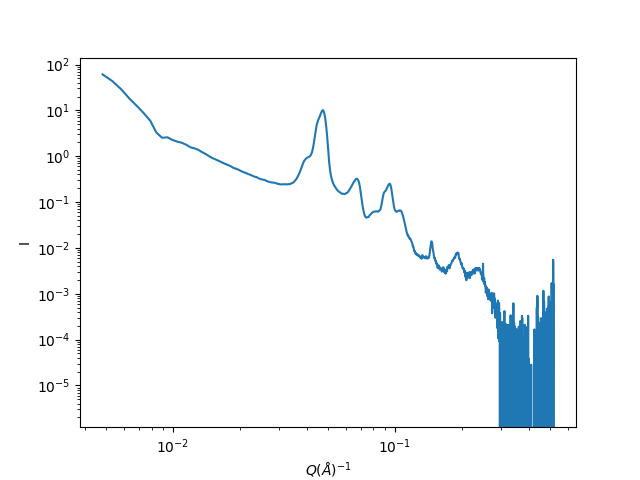

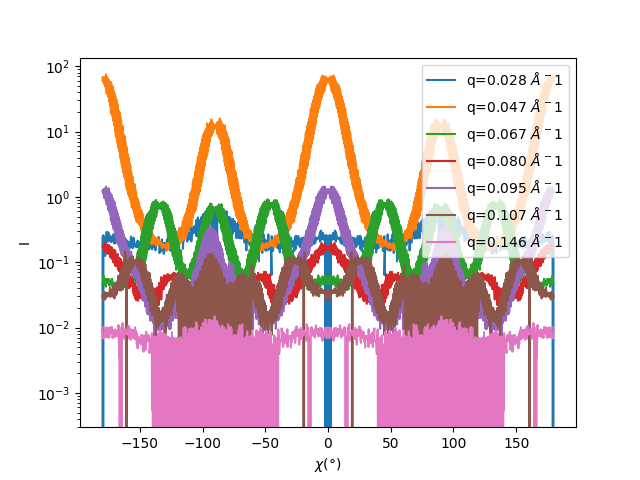

In [21]:
from excel_parameters_extractor import get_all_params
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/lacroix_00197_2026-02-06_19-03-08.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')


corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=7,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)


plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

### Measurement M0137

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0137 for index of h5 file 198.0
Extracted parameters from excel:
Length of the cube: 11,1 nm
Polydispersity on length: 6.306306306306306 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm\lacroix_00196_2026-02-06_18-39-18.nxs
position moteur :
{'X_start': array([37.9001]), 'X_end': array([38.2801]), 'Z_start': array([39.9996]), 'Z_end': array([41.4801])}
{'X_start': array([37.9001]), 'X_end': array([38.2801]), 'Z_start': array([39.9996]), 'Z_end': array([41.4801])}
step :
[0.019]
[0.01974]
1
Raw data shape: (20, 75, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4996]), 'X_end': array([38.3998]), 'Z_start': array([39.6994]), 'Z_end': array([41.6002])}
{'X_start': array([36.4996]), 'X_end': array([38.3998]), 'Z_start': array([39.6994]), 'Z_end': array([41.6002])}
step :
[0.09501]
[0.09504]
1
Raw data shape: (20, 20, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel siz

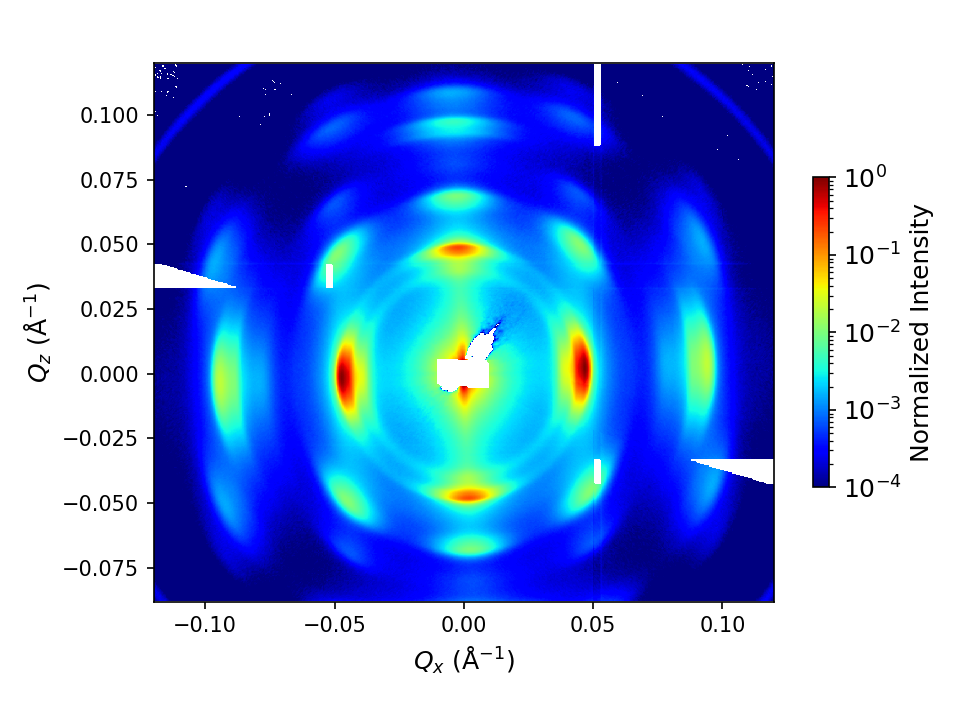

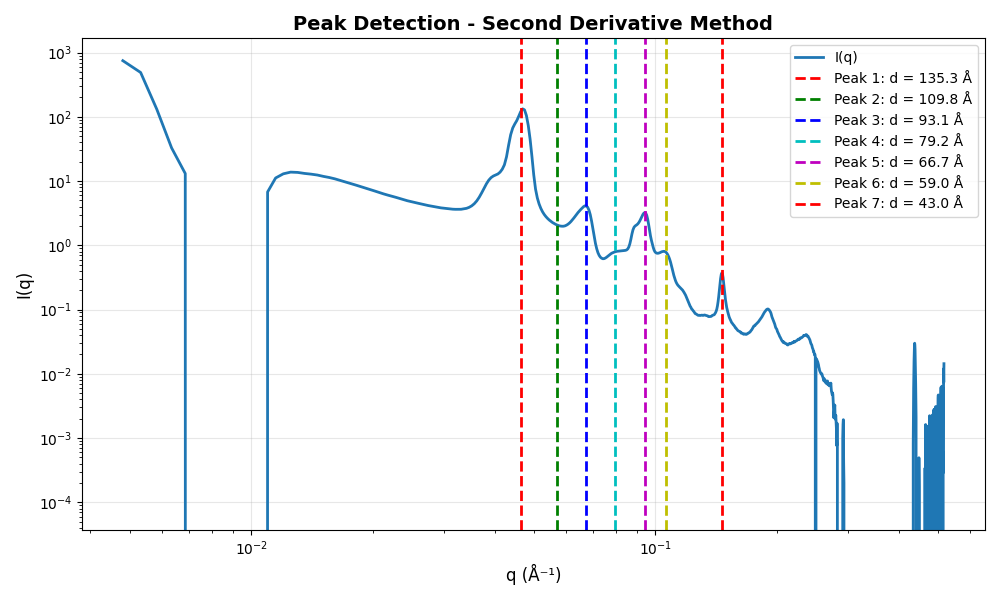

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/saxs_images/S0020_M0137_Img_198_with_q-circles.png


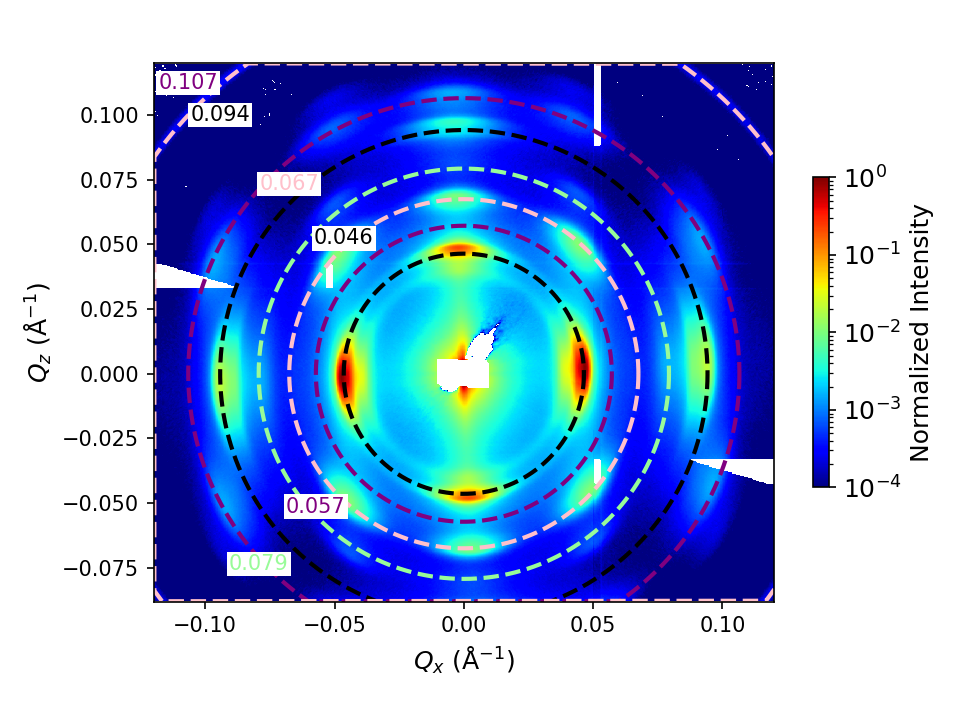

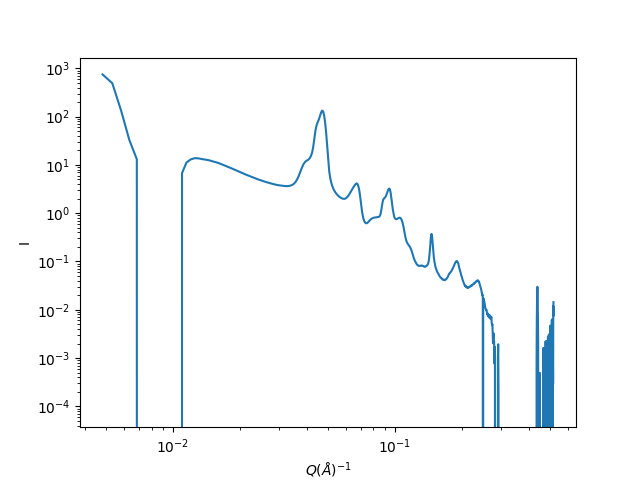

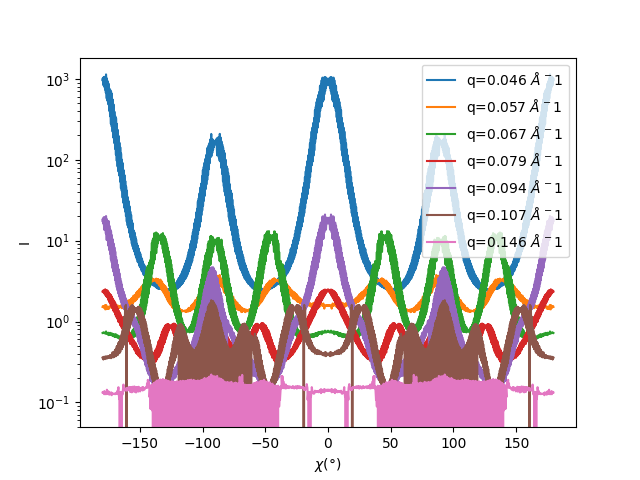

In [26]:
from excel_parameters_extractor import get_all_params
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/lacroix_00198_2026-02-06_19-08-23.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')


corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=7,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.03,
    qmax=0.15)


plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

### Measurement M0138

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0138 for index of h5 file 199.0
Extracted parameters from excel:
Length of the cube: 11,1 nm
Polydispersity on length: 6.306306306306306 %
Reference file: None
position moteur :
{'X_start': array([36.8999]), 'X_end': array([37.0497]), 'Z_start': array([39.2994]), 'Z_end': array([41.4499])}
{'X_start': array([36.8999]), 'X_end': array([37.0497]), 'Z_start': array([39.2994]), 'Z_end': array([41.4499])}
step :
[0.03745]
[0.048875]
1
Raw data shape: (4, 44, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel size: 7.5e-05x7.5e-05
Due to binning, pixel size was modified to 0.00015x0.00015
(1083, 1035)
✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/saxs_images/S0020_M0138_Img_199.png


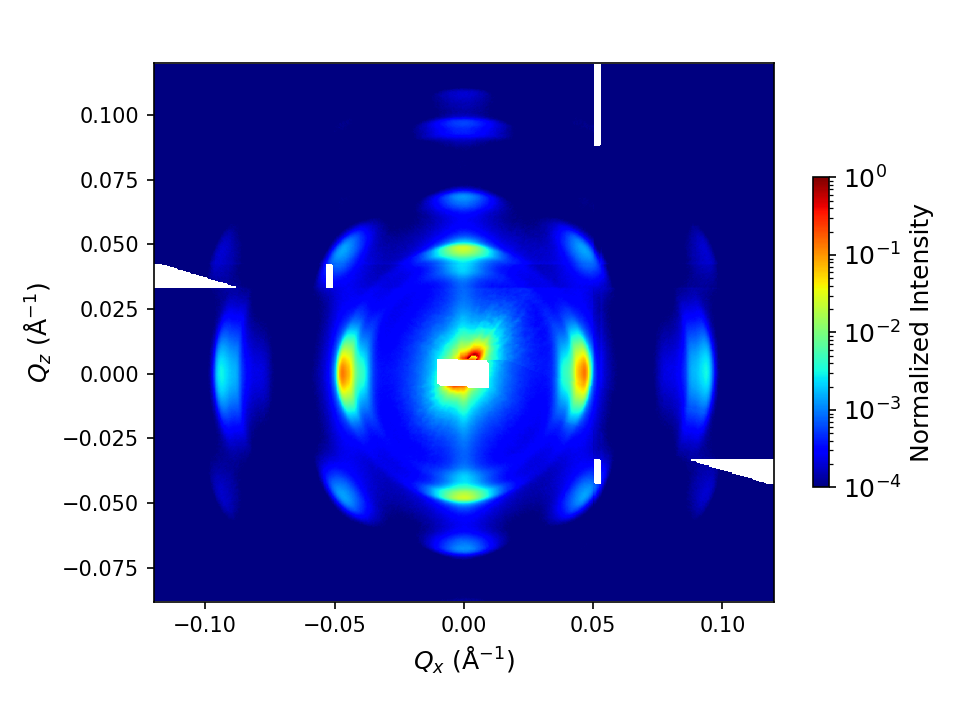

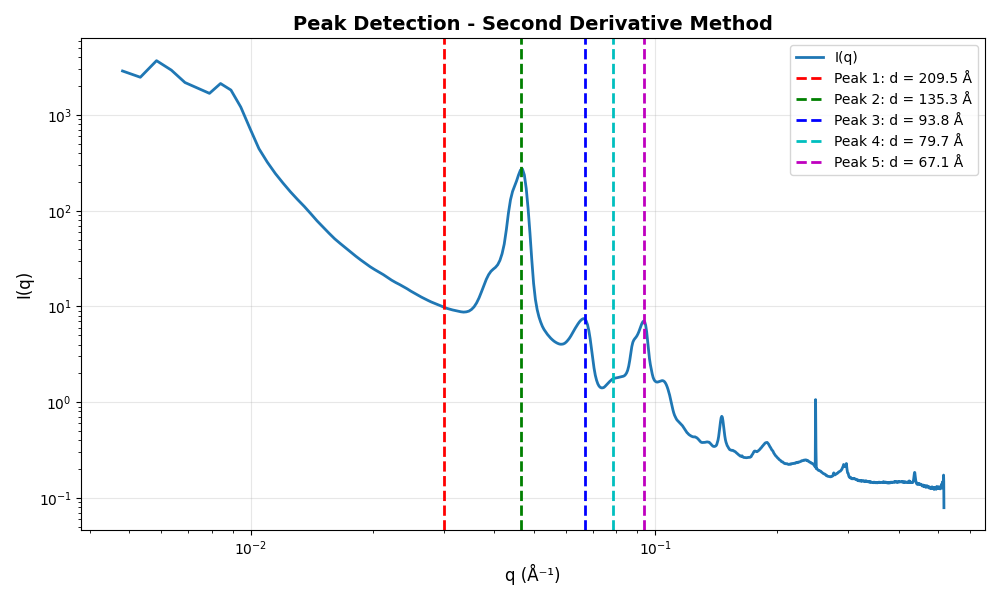

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/saxs_images/S0020_M0138_Img_199_with_q-circles.png


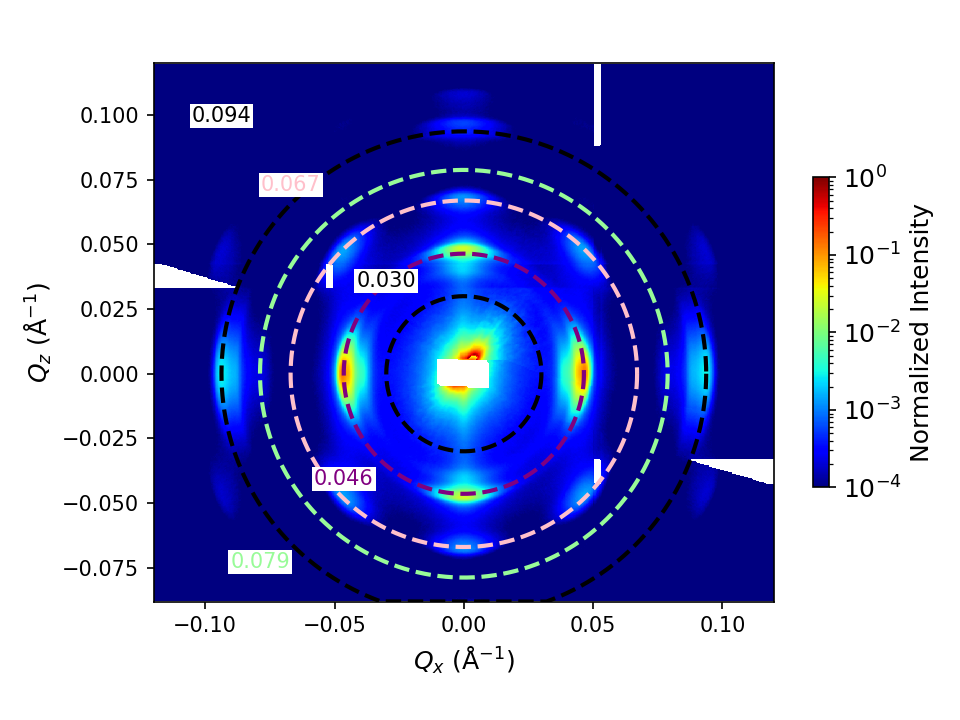

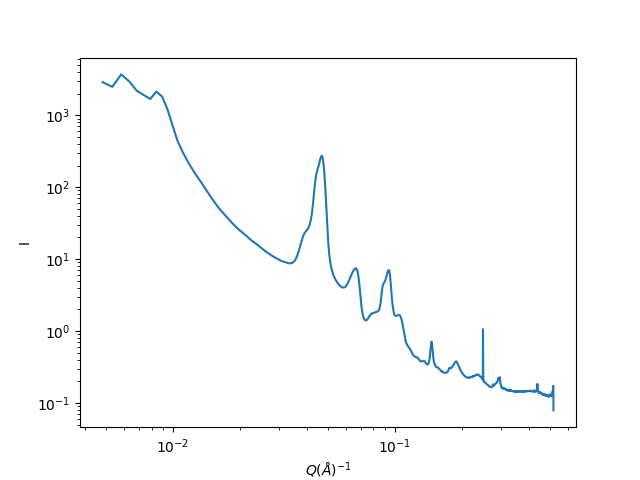

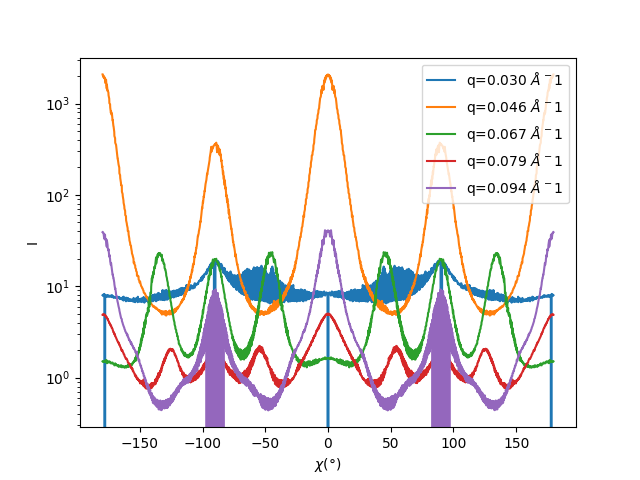

In [25]:
from excel_parameters_extractor import get_all_params
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/cubes_11nm/lacroix_00199_2026-02-06_20-13-04.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case

# Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')


corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=5,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)


plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)

### **Sphere of 12 nm**

### Measurement M0182

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)
c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\openpyxl\worksheet\_reader.py:329: UserWarning: Data Validation extension is not supported and will be removed
  warn(msg)


Measurement name found: M0182 for index of h5 file 242.0
Extracted parameters from excel:
Length of the cube: 10.2 nm
Polydispersity on length: 16.666666666666668 %
Reference file: test_data/SWING_fev2026/example_theo_cubes/sphere_12nm\lacroix_00148_2026-02-06_06-55-44.nxs
position moteur :
{'X_start': array([36.7999]), 'X_end': array([36.9997]), 'Z_start': array([39.9998]), 'Z_end': array([40.4997])}
{'X_start': array([36.7999]), 'X_end': array([36.9997]), 'Z_start': array([39.9998]), 'Z_end': array([40.4997])}
step :
[0.03996]
[0.04544545]
1
Raw data shape: (5, 11, 1083, 1035)
info
1083
1035
position moteur :
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
{'X_start': array([36.4998]), 'X_end': array([38.6997]), 'Z_start': array([39.4997]), 'Z_end': array([40.9])}
step :
[0.183325]
[0.1750375]
1
Raw data shape: (12, 8, 1083, 1035)
info
1083
1035
No motor positions provided. Update filereaders.py if required
Initial pixel s

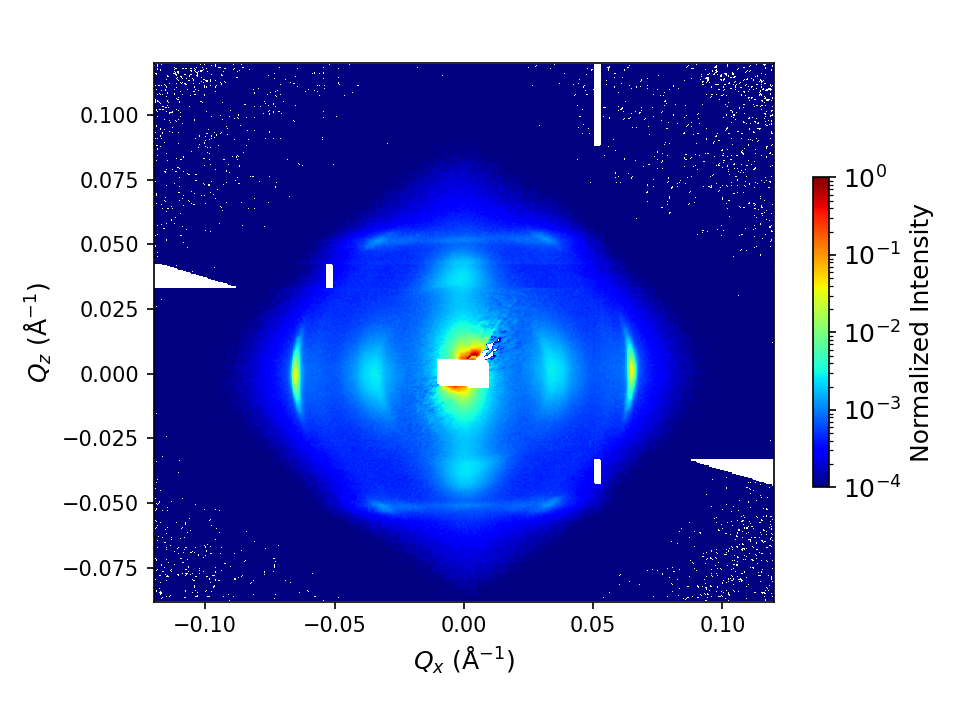

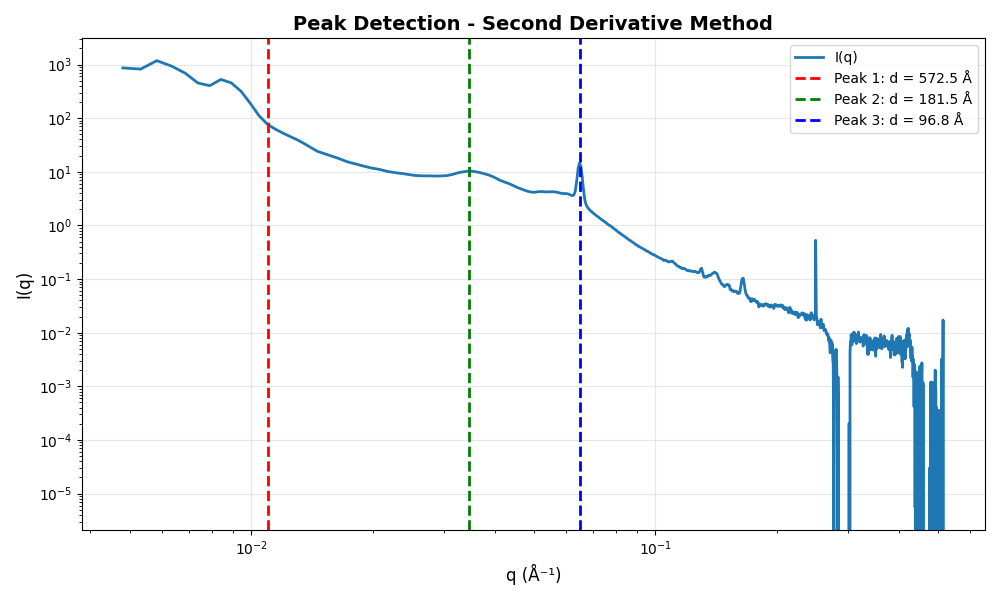

c:\Users\saram\anaconda3\envs\debye3d_env\Lib\site-packages\pyFAI\integrator\azimuthal.py:615: RuntimeWarning: invalid value encountered in divide
  intensity = sum_signal / sum_normalization


✅ SAXS image saved: test_data/SWING_fev2026/example_theo_cubes/sphere_12nm/saxs_images/S0027_M0182_Img_242_with_q-circles.png


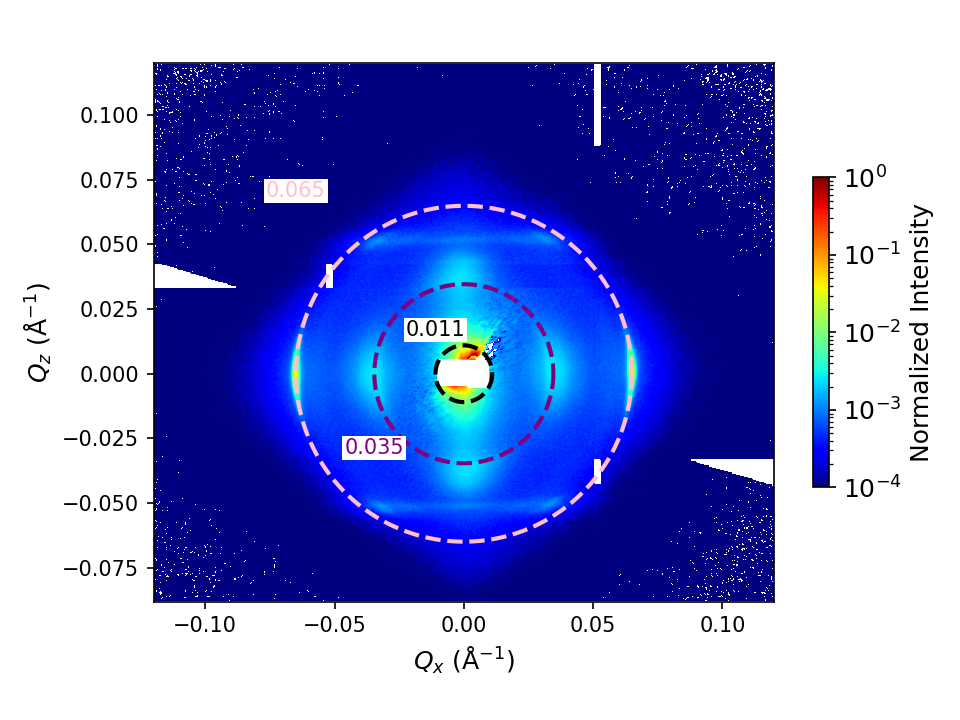

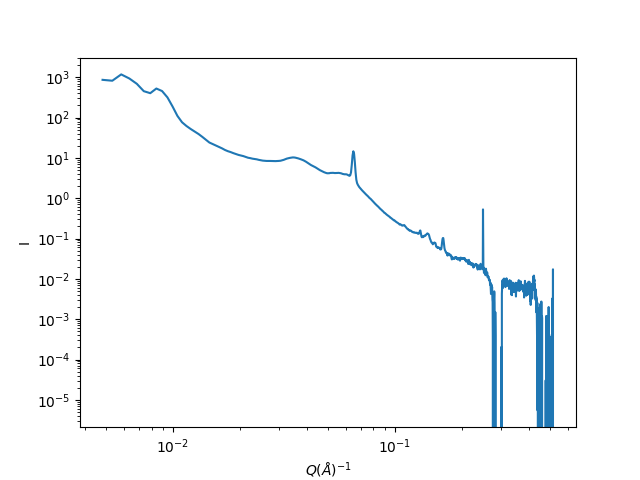

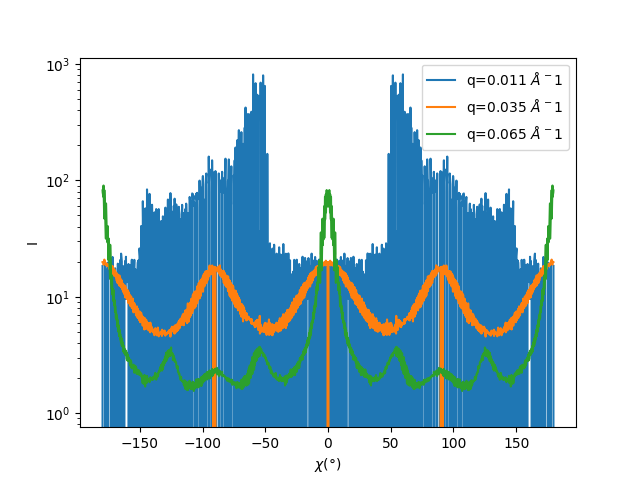

In [10]:
from excel_parameters_extractor import get_all_params
excel_file = "Run_synchrotron_SOLEIL_02_2026_suivi_manips.xlsm" # path to the excel file containing the parameters 
bg_path = "test_data/SWING_fev2026/example_theo_cubes/sphere_12nm" # path of the folder containing the background files (probably the same as the folder containing the h5 files)
fileh5 = "test_data/SWING_fev2026/example_theo_cubes/sphere_12nm/lacroix_00242_2026-02-07_02-18-34.nxs" # your path to the h5 file you want to analyze
mask = "test_data/SWING_fev2026/mask_pyfai.edf"

length, polydispersity, _, _, reference_file  = get_all_params(excel_file, bg_path, fileh5) # here specify the measurement name
print("Extracted parameters from excel:")
print(f"Length of the cube: {length} nm")
print(f"Polydispersity on length: {polydispersity} %")
print(f"Reference file: {reference_file}") # should be 00148 in this case


# Make an instance of the SAXSProcessor class with the extracted parameters
proc = SAXSProcessor(instrument="SWING",reference_file=reference_file ,autosubstract=True,file=fileh5, mask=mask)
proc.plot2d_vsq(q_range=[0,0.12])

q,Ir = proc.extract_radial_profile(width=360)

plt.figure()
plt.loglog(q,Ir)
plt.xlabel('$Q (\AA)^{-1}$')
plt.ylabel('I')


corr= CorrelationDistanceCalculator(proc)
peaklist = corr.detect_peaks_derivative(
    q, Ir,
    nb_peaks=3,
    window_length=15,
    polyorder=3,
    prominence=0.5,
    distance_pts=20,    
    plot=True,
    qmin = 0.01,
    qmax=0.15)


plt.figure()
for peak in peaklist:
    chi,I = proc.extract_azimuthal_profile(qvalue= peak, threshold= 0.05,apply_mirror=True)
    
    plt.semilogy(chi,I,label=f'q={peak:.3f} $\AA^{-1}$')
    plt.xlabel('$\\chi(°)$')
    plt.ylabel('I')
plt.legend(loc=1)

proc.plot2d_vsq(q_range=[0,0.12],q_circles=peaklist)